# Example implementation of t-SNE

### Useful links to learn about t-SNE:

https://www.youtube.com/watch?v=RJVL80Gg3lA&list=UUtXKDgv1AVoG88PLl8nGXmw

https://lvdmaaten.github.io/tsne/

https://distill.pub/2016/misread-tsne/##

### Starter advice for working with t-SNE:

Basics: t-SNE seeks to represent the distances of points in high dimensional parameter space in (usually) two dimensional parameter space. Where PCA is linear and mathematical, t-SNE is nonlinear and probabalistic. It has a non-convex loss function, so every training is unique. t-SNE can be used to visualize data, and to help understand what underlying attributes the selected features capture.

Assesing quality: The only undisputed advice for this is to just look at the plots. If the points aren't resolving into clear groups, this could be a user error or this could reflect a lack of structure in the data. If the groupings are elongated, this is a sign that the embedding hasn't run for enough iterations. You can run the t-SNE multiple times with the exact same data and hyperparameters, and select the version with the lowest KL divergence.

Hyperparameter fine tuning: There are conflicting claims on t-SNE's robustness to hyperparameter selection. It likely depends greatly on the dataset. Perplexity, which roughly describes how many effective nearest neigbors a given point has, is one important value to look at. It is advised to be set between 5 and 50, but should be larger for larger and denser datasets. Learning rate and exaggeration are other hyperparameters to experiment with.

Interpreting the plot: The size of clusters and the distance of clusters from each other should not be considered meaningful. Noise can appear to have a pattern in the plot in unlucky data+hyperparameter combinations.

# prep data

In [1]:
from tsne import tSNEDataPreprocessor, tSNE

In [2]:
example_path = '../example_data/240319_full.parquet'

In [2]:
# Preprocess data and perform PCA
preprocessor = tSNEDataPreprocessor(path=example_path)
df = preprocessor.preprocess_data()
pca_result = preprocessor.get_pca(df, ncomp=40)

Cumulative explained variation for 50 principal components: 0.9530760311480287


In [3]:
# Perform t-SNE
tsne_save_path = "./tsne_results.pkl" 
tsne_processor = tSNE(pca_result, perplexity=60, max_iter=2000, method='barnes_hut', n_jobs=8, save_path=tsne_save_path)
tsne_results = tsne_processor.get_tsne()

# optionally get additional labels and classifications for data

In [3]:
# load df
import pandas as pd
df_add_classification = pd.read_parquet(example_path)

In [11]:
from alert_classifications import FritzNightClassifications

In [ ]:
# get fritz classifications from the same night
fritznight_data, df_add_classification = FritzNightClassifications(df_add_classification, add_to_df=True).get_classifications()

In [ ]:
from alert_classifications import SimbadClassifications

In [ ]:
# simbad classifications (will only look at filtered alerts to save time)
savepath = './simbad_filtered.pkl'
simbad_data, df_add_classification = FritzNightClassifications(df_add_classification, savepath, add_to_df=True).get_classifications()

In [229]:
from alert_classifications import CatalogClassifications

In [21]:
# catnorth catalog crossmatch
catnorth_data, df_add_classification = CatalogClassifications(df_add_classification, 'CatNorth', {"z_xp_nn": 1}, 'gloria', add_to_df=True).get_classifications()

In [83]:
# gaia
gaia_data, df_add_classification = CatalogClassifications(df_add_classification, 'Gaia_DR2', {"source_id": 1}, 'kowalski', , add_to_df=True).get_classifications()    

In [ ]:
from alert_classifications import FritzClassifications

In [ ]:
# crossmatching with objects in the ~20k object catalog with fritz classifications
fritz_data, df_add_classification = FritzClassifications(df_add_classification, add_to_df=True).get_classifications()

In [ ]:
from alert_classifications import AcaiClassifications

In [ ]:
# check if the alert has a dominant acai score
acai_data, df_add_classification = AcaiClassifications(df_add_classification, add_to_df=True).get_classifications()

In [ ]:
from alert_classifications import FilterClassifications

In [ ]:
# assign a classification based on what the filter passed should be looking for

filter_data, df_add_classification = FilterClassifications(df_add_classification, add_to_df=True).get_classifications()

In [150]:
# save this df with classifications
df_filepath = './df_with_classifications.parquet'
df_add_classification.to_parquet(df_filepath)

# inspect t-SNE -- still sorting through this code

In [3]:
# load already trained tsne results
import pickle

with open(tsne_save_path, 'rb') as f:
    tsne_results = pickle.load(f)   

# load df with classifications, can replace with the initial df

df_plot = pd.read_parquet(df_filepath)

df_plot = df_plot[df_plot['drb'] > 0.4]
df_plot['tsne-2d-one'] = tsne_results[:,0]
df_plot['tsne-2d-two'] = tsne_results[:,1]

# working on transfering these to plots_tsne.py

In [88]:
# color based on whether the alert was filtered
from plot_tsne import TsnePlotter
plotter = TsnePlotter(df_plot)

In [ ]:
plotter.plot_parameter_analysis(df_plot)

In [ ]:
# color based on custom input feature (any column in df)
from plot_tsne import TsnePlotter_featurecolor
plotter = TsnePlotter_featurecolor(df_plot)

In [ ]:
plotter.plot_parameter_analysis(df_plot, 'sgscore1', reorder=True, ascending=False, remove_error_values=True)

In [ ]:
# plot unfiltered as density (this is slow)
from plot_tsne import TsnePlotter_density
plotter = TsnePlotter_density(df_plot)

In [ ]:
plotter.plot_filtered_density(df_plot)

/home/kira/mypy/environments/astroenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


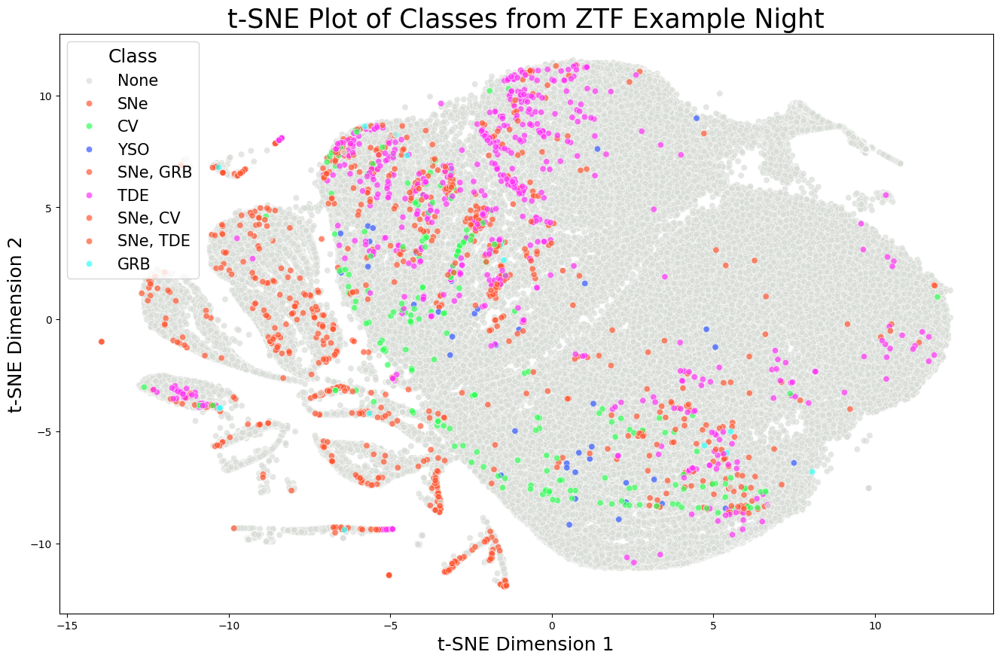

In [91]:
# sort all filters into a few categories: supernovae, variables, other and color on that
custom_palette = ["#d8dcd6", "#FF5733", "#33FF57", "#3357FF", "#FF5733", "#FF33F6", "#FF5733", "#FF5733", "#33FFF6"]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="class",
    palette=custom_palette,
    data=tsne_plotordered,
    legend="full",
    alpha=0.7
)

plt.legend(title='Class', title_fontsize='18', fontsize='15')

# Customize the axis labels
plt.xlabel('t-SNE Dimension 1', fontsize=18)
plt.ylabel('t-SNE Dimension 2', fontsize=18)

# Add a title
plt.title('t-SNE Plot of Classes from ZTF Example Night', fontsize=25)

plt.show()

In [92]:
# plot catalog crossmatches

# shift around df to plot classified on top of unclassified
def format_df(df):
    conditions = [
        (df['catnorth'] == True) & (df['gaia'].notna()),
        (df['catnorth'] == True),
        (df['gaia'].notna())
    ]
    choices = ['both', 'catnorth', 'gaia']
    df['catalog_bool'] = np.select(conditions, choices, default='none')
    tsne_classified = df[df['catalog_bool'] != 'none']
    tsne_unclassified = df[df['catalog_bool'] == 'none']
    tsne_plotordered = pd.concat([tsne_unclassified, tsne_classified])
    return tsne_plotordered

tsne_catalog_ordered = format_df(df_plot)

/tmp/ipykernel_4657/787983002.py:5: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  sns.scatterplot(


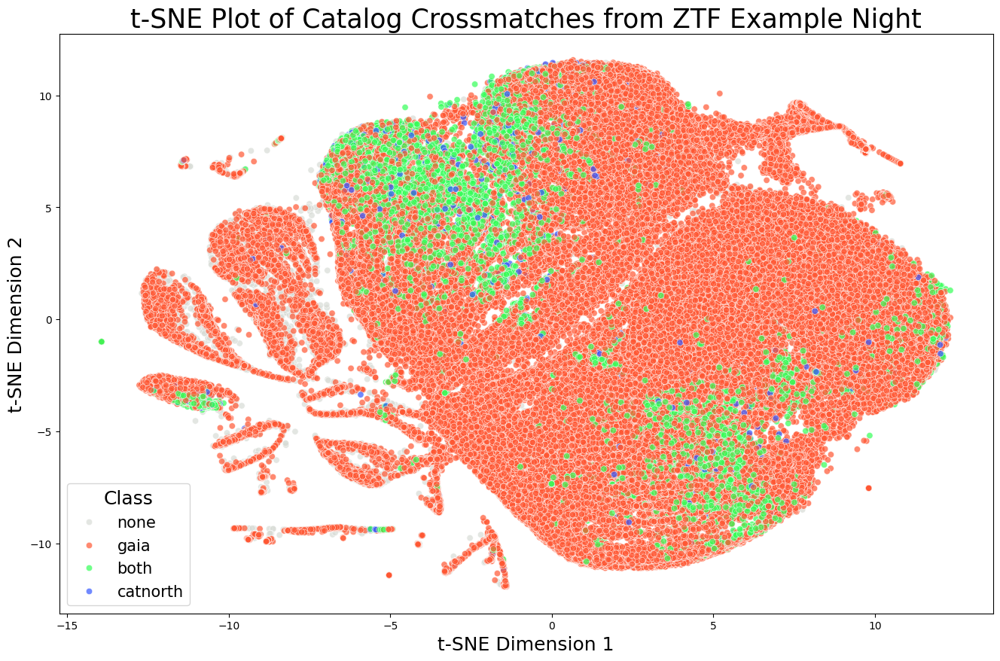

In [93]:
# penquins catalog crossmatches
custom_palette = ["#d8dcd6", "#FF5733", "#33FF57", "#3357FF", "#FF5733"]#, "#FF33F6", "#FF5733", "#FF5733", "#33FFF6"]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="catalog_bool",
    palette=custom_palette,
    data=tsne_catalog_ordered,
    legend="full",
    alpha=0.7
)

plt.legend(title='Class', title_fontsize='18', fontsize='15')

# Customize the axis labels
plt.xlabel('t-SNE Dimension 1', fontsize=18)
plt.ylabel('t-SNE Dimension 2', fontsize=18)

# Add a title
plt.title('t-SNE Plot of Catalog Crossmatches from ZTF Example Night', fontsize=25)

plt.show()

In [94]:
# shift around df to plot classified on top of unclassified
def format_df(df):
    tsne_classified = df[df['scope_classification'] != '']
    tsne_unclassified = df[df['scope_classification'] == '']
    tsne_plotordered = pd.concat([tsne_unclassified, tsne_classified])
    return tsne_plotordered

tsne_plotordered_aj = format_df(df_plot)

In [95]:
# condense some subclassifications for readability

def classify_scope(value):
    if value == '':
        return ''
    elif 'SN' in value:
        return 'SN'
    elif any(substring in value for substring in ['Stellar variable', 'YSO', 'FU Ori', 'LPV', 'Cataclysmic', 'AM CVn', 'RR Lyrae', 'S Doradus', 'Eclipsing', 'Pulsar', 'Polars']):
        return 'Stellar'
    elif any(substring in value for substring in ['AGN', 'BL Lac', 'Seyfert', 'QSO', 'Blazar']):
        return 'Galactic Nucclei'    
    else:
        return value

tsne_plotordered_aj['simplified_scope_classification'] = tsne_plotordered_aj['scope_classification'].apply(classify_scope)

/home/kira/mypy/environments/astroenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


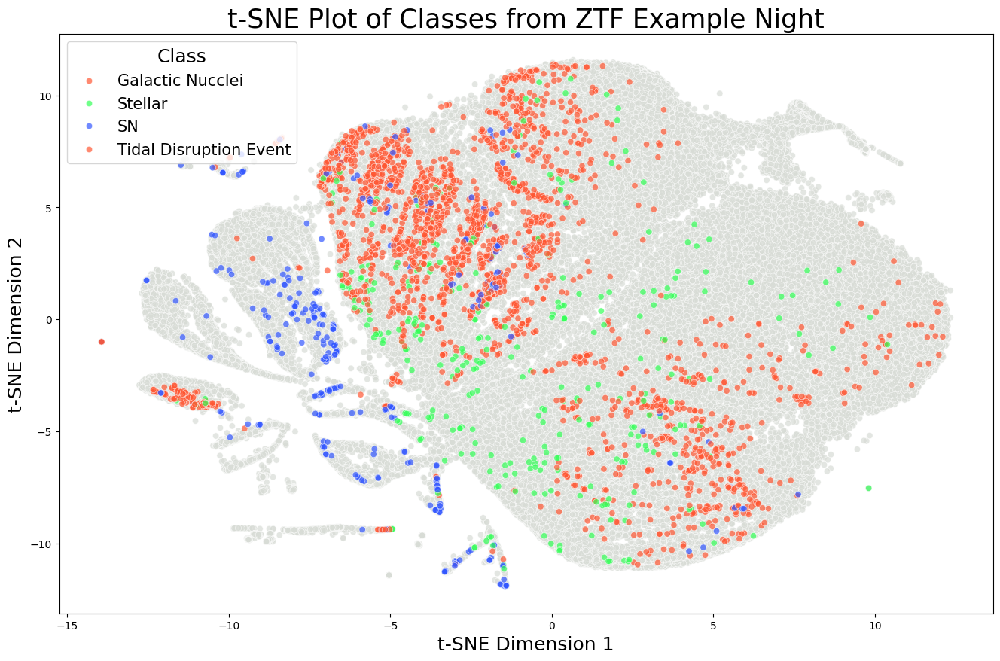

In [96]:
# classifications from AJ
custom_palette = ["#d8dcd6", "#FF5733", "#33FF57", "#3357FF", "#FF5733"]#, "#FF33F6", "#FF5733", "#FF5733", "#33FFF6"]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="simplified_scope_classification",
    palette=custom_palette,
    data=tsne_plotordered_aj,
    legend="full",
    alpha=0.7
)

plt.legend(title='Class', title_fontsize='18', fontsize='15')

# Customize the axis labels
plt.xlabel('t-SNE Dimension 1', fontsize=18)
plt.ylabel('t-SNE Dimension 2', fontsize=18)

# Add a title
plt.title('t-SNE Plot of Classes from ZTF Example Night', fontsize=25)

plt.show()

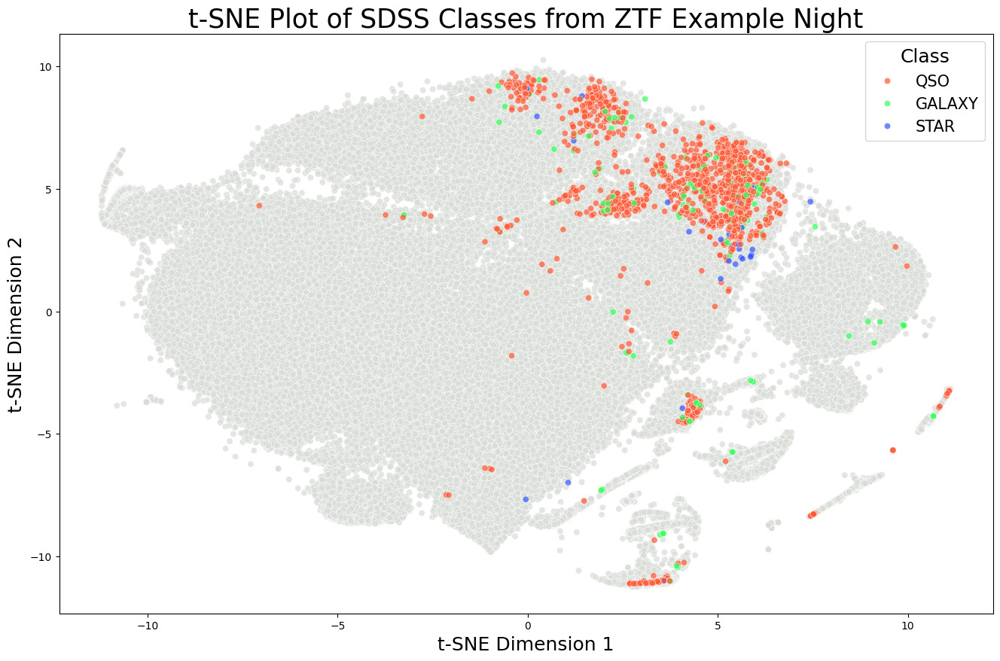

In [178]:
# SDSS classes from AJ
custom_palette = ["#d8dcd6", "#FF5733", "#33FF57", "#3357FF"]#, "#FF5733", "#FF33F6", "#FF5733", "#FF5733", "#33FFF6"]

# shift around df to plot filtered on top of unfiltered
def format_df(df):
    tsne_classified = df[df['sdss_match'] != '']
    tsne_unclassified = df[df['sdss_match'] == '']
    tsne_plotordered = pd.concat([tsne_unclassified, tsne_classified])
    return tsne_plotordered

tsne_plotordered_sdss = format_df(df_plot)

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="sdss_match",
    palette=custom_palette,
    data=tsne_plotordered_sdss,
    legend="full",
    alpha=0.7
)

plt.legend(title='Class', title_fontsize='18', fontsize='15')

# Customize the axis labels
plt.xlabel('t-SNE Dimension 1', fontsize=18)
plt.ylabel('t-SNE Dimension 2', fontsize=18)

# Add a title
plt.title('t-SNE Plot of SDSS Classes from ZTF Example Night', fontsize=25)

plt.show()

In [63]:
def format_df_acai(df):
    ambiguous = df[df['acai'] == 'ambiguous']
    B = df[df['acai'] == 'B']
    O = df[df['acai'] == 'O']
    V = df[df['acai'] == 'V']
    N = df[df['acai'] == 'N']
    H = df[df['acai'] == 'H']
    tsne_plotordered_acai = pd.concat([B, O, N, V, H])
    tsne_plotordered_all =  pd.concat([ambiguous, B, O, N, V, H])
    return tsne_plotordered_acai, tsne_plotordered_all

tsne_plotacai, tsne_plotacai_all = format_df_acai(df_plot)

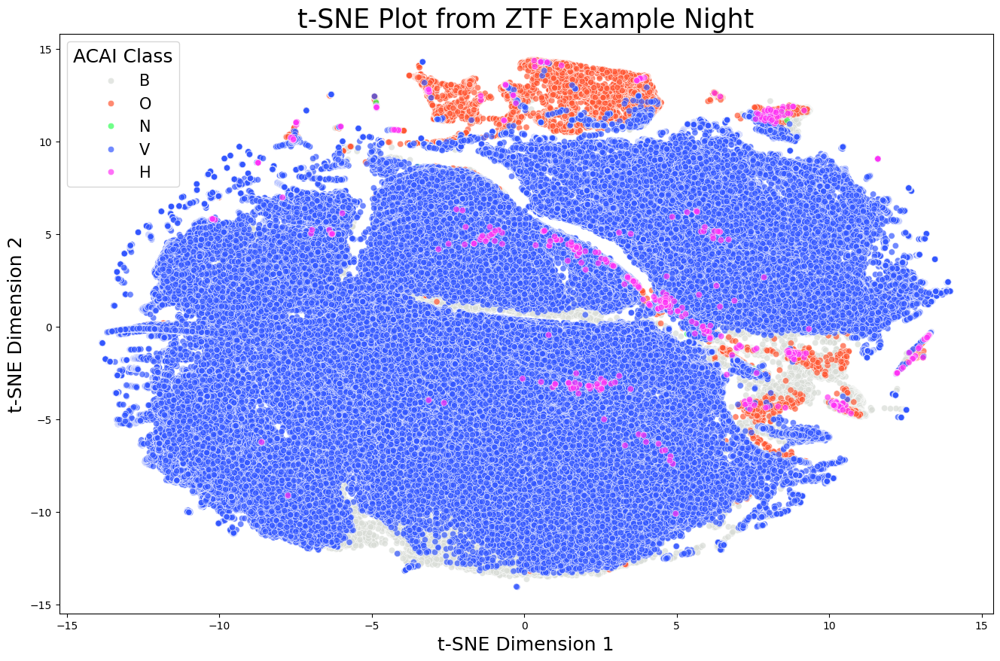

In [61]:
# color on acai values
custom_palette = ["#d8dcd6", "#FF5733", "#33FF57", "#3357FF", "#FF33F6"]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="acai",
    palette=custom_palette,
    data=tsne_plotacai,
    legend="full",
    alpha=0.7
)

plt.legend(title='ACAI Class', title_fontsize='18', fontsize='15')

# Customize the axis labels
plt.xlabel('t-SNE Dimension 1', fontsize=18)
plt.ylabel('t-SNE Dimension 2', fontsize=18)

# Add a title
plt.title('t-SNE Plot from ZTF Example Night', fontsize=25)

plt.show()

In [116]:
def move_to_end(lst, index):
    """
    Moves the item at the specified index to the end of the list.

    Parameters:
    lst (list): The list to modify.
    index (int): The index of the item to move.

    Returns:
    list: The modified list with the item moved to the end.
    """
    item = lst.pop(index)
    lst.append(item)
    return lst

# test
lst = ["ambiguous", "B", "O", "N", "V", "H"]
index = 0  # Example index
modified_list = move_to_end(lst, index)
print(modified_list)

['B', 'O', 'N', 'V', 'H', 'ambiguous']


In [117]:
def format_df_acai_custom(df, index):
    ambiguous = df[df['acai'] == 'ambiguous']
    B = df[df['acai'] == 'B']
    O = df[df['acai'] == 'O']
    V = df[df['acai'] == 'V']
    N = df[df['acai'] == 'N']
    H = df[df['acai'] == 'H']
    plot_order = [ambiguous, B, O, N, V, H]
    item = plot_order.pop(index)
    plot_order.append(item)
    tsne_plotordered_all =  pd.concat(plot_order)
    return tsne_plotordered_all

/home/kira/mypy/environments/astroenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


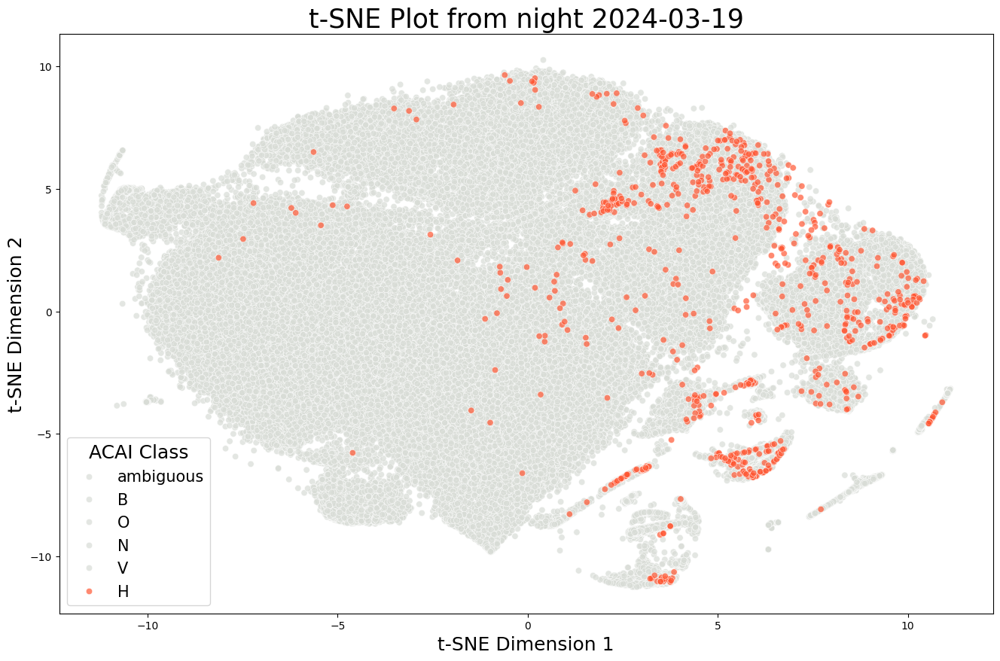

In [118]:
# plot one acai class at a time
# choose class index to plot: ambiguous, B, O, N, V, H
i = 5

tsne_plotacai_all = format_df_acai_custom(df_plot,i)
# color on acai values
custom_palette = ["#d8dcd6", "#d8dcd6", "#d8dcd6", "#d8dcd6", "#d8dcd6","#FF5733"]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="acai",
    palette=custom_palette,
    data=tsne_plotacai_all,
    legend="full",
    alpha=0.7
)

plt.legend(title='ACAI Class', title_fontsize='18', fontsize='15')

# Customize the axis labels
plt.xlabel('t-SNE Dimension 1', fontsize=18)
plt.ylabel('t-SNE Dimension 2', fontsize=18)

# Add a title
plt.title(f't-SNE Plot from night {night}', fontsize=25)

plt.show()

In [25]:
# look at simad classifications

unique_values = df['simbad_classification'].unique()
value_counts = df['simbad_classification'].value_counts()
for value, count in value_counts.items():
    print(f"{value}: {count}")

: 201161
[]: 857
['Seyfert 1 Galaxy']: 704
['Galaxy']: 91
['Quasar']: 84
['Cataclysmic Binary']: 54
['Eclipsing Binary']: 42
['Seyfert 2 Galaxy']: 25
['Active Galaxy Nucleus']: 20
['Cataclysmic Binary Candidate']: 16
['Long-Period Variable']: 13
['Star']: 12
['BL Lac']: 10
['Galaxy towards a Group of Galaxies']: 10
['Radio Source']: 10
['Active Galaxy Nucleus Candidate']: 9
['LINER-type Active Galaxy Nucleus']: 9
['RR Lyrae Variable']: 8
['Radio Source', 'Seyfert 1 Galaxy']: 6
['Emission-line Star']: 6
['Blue Object']: 6
['Galaxy', 'Radio Source']: 5
['X-ray Source']: 5
['SuperNova']: 5
['Cataclysmic Binary', 'UV-emission Source']: 5
['Long-Period Variable Candidate']: 4
['Variable Star']: 4
['Galaxy', 'Seyfert 1 Galaxy']: 3
['Seyfert 2 Galaxy', 'HII Region', 'HII Region', 'HII Region', 'HII Region', 'HII Region', 'HII Region']: 3
['Quasar', 'Radio Source']: 3
['delta Sct Variable']: 3
['X-ray Binary']: 3
['Blazar']: 3
['Mira Variable']: 3
['Classical Nova']: 3
['Brightest Galaxy in a 

In [26]:
custom_values = ["not filtered", 
                 "Radio Source",
                  "filtered no class", 
                  "Eclipsing Binary",
                  "Blazar",
                  "Long-Period Variable",# Candidate", 
                  "Galaxy",#"Emission-line galaxy",
                  "Star",
                  "Variable Star",
                  "Variable Star",#"['Mira Variable']"
                  "Cataclysmic Binary", 
                  "Active Galaxy Nucleus",# Candidate"
                  "Active Galaxy Nucleus",#" 'Galaxy']" 
                  "Long-Period Variable",
                  "Binary", #Spectroscopic 
                  "Variable Star",#['RR Lyrae Variable']"
                  "Cataclysmic Binary",# Candidate",
                  "Cataclysmic Binary",# Candidate",#', 'Transient Event']" 
                  "Galaxy",
                  "Star",#"['Emission-line Star']" 
                  "Classical Nova",
                   "Seyfert 2 Galaxy",
                   "Galaxy",#"['Galaxy towards a Group of Galaxies']"
                   "Galaxy",#radio
                   "filtered no class",#"Blue Object",
                   "X-ray Binary", 
                   "Seyfert 1 Galaxy",
                   "X-ray Source", 
                   "Object of Unknown Nature",
                   "Quasar",#', 'Transient Event']",
                   "Variable Star",#"Orion Variable", #Young Stellar Object', 'Young Stellar Object']"
                   "Active Galaxy Nucleus", 
                   "Variable Star",#"delta Sct Variable", 
                   "Quasar",
                   "Cataclysmic Binary",#', 'UV-emission Source']" 
                   "Radio Source",
                   "Active Galaxy Nucleus",#"BL Lac", 
                   "Galaxy",#', 'X-ray Source']" 
                   "Blazar",# Candidate']"
                   "Cataclysmic Binary",#', 'Near-IR Source (λ < 3 µm)', 'Star']"
                   "Active Galaxy Nucleus", #['LINER-type 
                   "Galaxy",
                   "Galaxy",#"Emission-line galaxy",#', 'Far-IR source (λ >= 30 µm)']"
                   "White Dwarf Candidate",#']" 
                   "Quasar",#', 'Radio Source']"
                   "Galaxy",#', 'Radio Source']" 
                   "Galaxy",#', 'Transient Event']"
                   "Seyfert 2 Galaxy",#', 'HII Region'"
                   "SuperNova", 
                   "Galaxy",#['Brightest Galaxy in a Cluster (BCG)']"
                   "Binary",#', 'Double or Multiple Star', 'Star']"
                   "Seyfert 2 Galaxy",#, 'Young Stellar Object']"
                   "Seyfert 1 Galaxy",#', 'Transient Event']"
                   "Galaxy",#['Galaxy towards a Cluster of Galaxies']" 
                   "Star", #Seyfert 2 Galaxy
                   "Seyfert 1 Galaxy",#', 'Cluster of Galaxies']"
                   "Seyfert 1 Galaxy",#Radio Source', ' 
                   "Transient Event",
                   "SuperNova",#" 'Galaxy']" 
                   "Variable Star",#""BY Dra Variable",
                   "Variable Star",#"['Cepheid Variable', 'Cepheid Variable', 'HII Region', 'Cepheid Variable']"
                   "Seyfert 1 Galaxy",#"['Near-IR Source (λ < 3 µm)', 'Seyfert 1 Galaxy']"
                   "Seyfert 1 Galaxy",#"['Galaxy', 'Seyfert 1 Galaxy']"
                   "Seyfert 1 Galaxy",#"['Seyfert 1 Galaxy', 'Group of Galaxies']" 
                   "Star",#"['Optical Source', 'Star']"
                   "Seyfert 2 Galaxy",#, 'Part of a Galaxy']"
                  ]  

# Create a mapping dictionary using the unique values and the custom values
mapping_dict = dict(zip(unique_values, custom_values))

# Add a new column with mapped values
df['my_simbad_tag'] = df['simbad_classification'].map(mapping_dict)

In [27]:
sort_key = {
    "not filtered": 0,
    "filtered no class": 1
}

# Apply the custom sorting key to the 'my_simbad_tag' column
df['sort_key'] = df['my_simbad_tag'].map(sort_key).fillna(2)

# Sort the DataFrame by the custom sorting key
df_simbad = df.sort_values(by='sort_key')

# Drop the temporary sorting key column
df_simbad = df_simbad.drop(columns=['sort_key'])

In [28]:
custom_palette = [
    "#d8dcd6",  # light gray
    "#FFFF00",  # yellow
    "#FF5733",  # warm color
    "#FF8D1A",  # different warm color
    "#FF6F61",  # different warm color
    "#32CD32",  # shade of green
    "#1E90FF",  # shade of blue
    "#4682B4",  # different shade of blue
    "#FF6347",  # different warm color
    "#FF7F50",  # different warm color
    "#5F9EA0",  # different shade of blue
    "#FF4500",  # different warm color
    "#6495ED",  # different shade of blue
    "#3CB371",  # different shade of green
    "#2E8B57",  # different shade of green
    "#4169E1",  # different shade of blue
    "#0000FF",  # different shade of blue
    "#66CDAA",  # different shade of green
    "#87CEEB",  # different shade of blue
    "#4682B4",  # different shade of blue
    "#8FBC8F",  # different shade of green
    "#1E90FF",  # different shade of blue
]

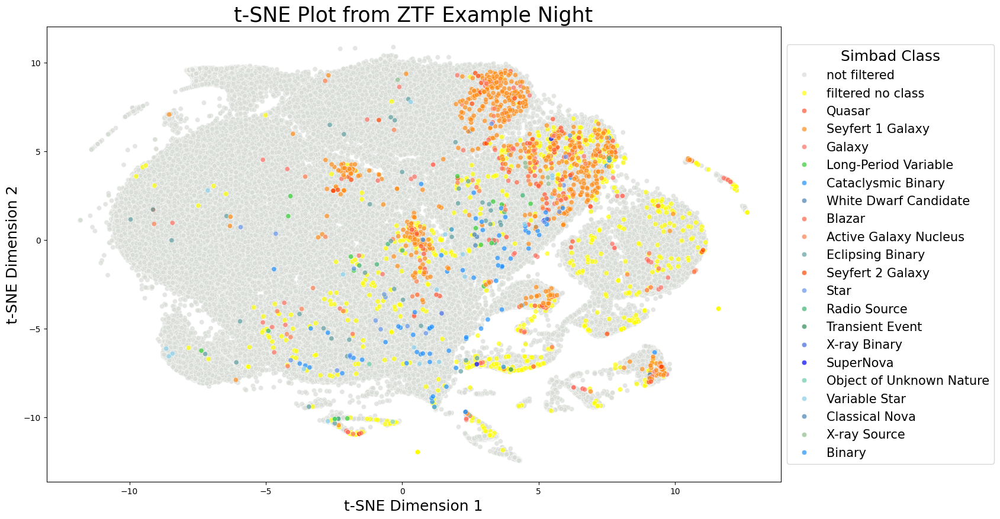

In [29]:
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="my_simbad_tag",
    palette=custom_palette,
    data=df_simbad,
    legend="full",
    alpha=0.7
)

plt.legend(
    title='Simbad Class', 
    title_fontsize='18', 
    fontsize='15', 
    loc='center left', 
    bbox_to_anchor=(1, 0.5)
)

# Customize the axis labels
plt.xlabel('t-SNE Dimension 1', fontsize=18)
plt.ylabel('t-SNE Dimension 2', fontsize=18)

# Add a title
plt.title('t-SNE Plot from ZTF Example Night', fontsize=25)

plt.show()

# selecting objects from map

Text(0.5, 1.0, 't-SNE Plot from ZTF Example Night')

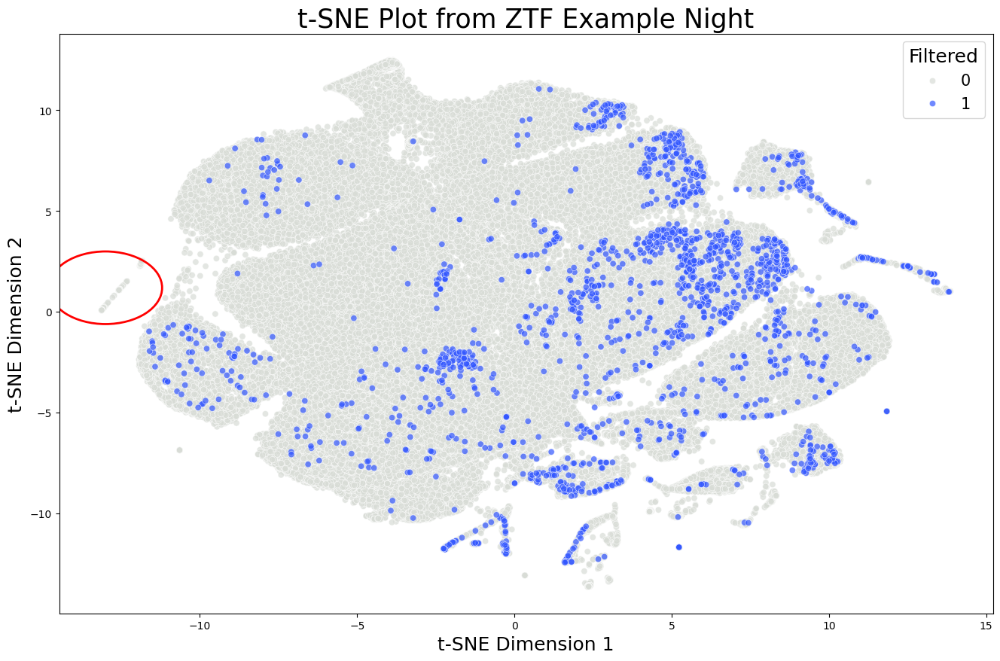

In [226]:
center = (-13,1.2)
radius = 1.8

plt.figure(figsize=(16,10))
custom_palette = ["#d8dcd6", "#3357FF"]
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="filtered_bool",
    palette=custom_palette,
    data=tsne_plotordered,
    legend="full",
    alpha=0.7
)

# Plot a circle
circle = plt.Circle(center, radius, color='red', fill=False, linewidth=2)
plt.gca().add_patch(circle)

plt.legend(title='Filtered', title_fontsize='18', fontsize='15')

# Customize the axis labels
plt.xlabel('t-SNE Dimension 1', fontsize=18)
plt.ylabel('t-SNE Dimension 2', fontsize=18)

# Add a title
plt.title('t-SNE Plot from ZTF Example Night', fontsize=25)

In [227]:
# select points on from visual inspection

# tool to select points within a radius of a point
def get_points_within_radius(df, x, y, radius):
    x_values = df['tsne-2d-one']
    y_values = df['tsne-2d-two']
    distances = np.sqrt((x_values - x)**2 + (y_values - y)**2)
    indices = np.where(distances < radius)
    return df.iloc[indices]

selected_alerts = get_points_within_radius(df_plot, -13, 1.2, 1.8)

In [237]:
#quick fix - add ra and dec
selected_rows = df.loc[selected_alerts.index]

# Add the candidate.ra and candidate.dec values to new columns in selected_alerts
selected_alerts['ra'] = selected_rows['candidate.ra'].values
selected_alerts['dec'] = selected_rows['candidate.dec'].values


In [240]:
#def get_simbad_classifications(df):
coords = [(x,y) for x,y in zip(selected_alerts['ra'], selected_alerts['dec'])]
sky_coords = [SkyCoord(ra=ra*u.degree, dec=dec*u.degree, frame='icrs') for ra, dec in coords]

In [243]:
custom_simbad = Simbad()
custom_simbad.add_votable_fields('ra', 'dec', 'otype', 'otype(V)', 'sptype', 'distance')

# Function to query SIMBAD for a single coordinate
def query_simbad(coord):
    result = custom_simbad.query_region(coord, radius='0d0m3s')
    return result

# Query SIMBAD for each coordinate and store the results in a list
simbad_results = []
for coord in sky_coords:
    try:
        result = query_simbad(coord)
    except ConnectionError as e:
        print(f"Connection error querying SIMBAD for {coord}: {e}")
        result = None
    except Exception as e:
        print(f"Error querying SIMBAD for {coord}: {e}")
        result = None
    simbad_results.append(result)

In [244]:
simbad_classifications = [list(result['OTYPE_V'].data) if result is not None else [] for result in simbad_results]

In [247]:
simbad = [x[0] if len(x) > 0 else 'None' for x in simbad_classifications]

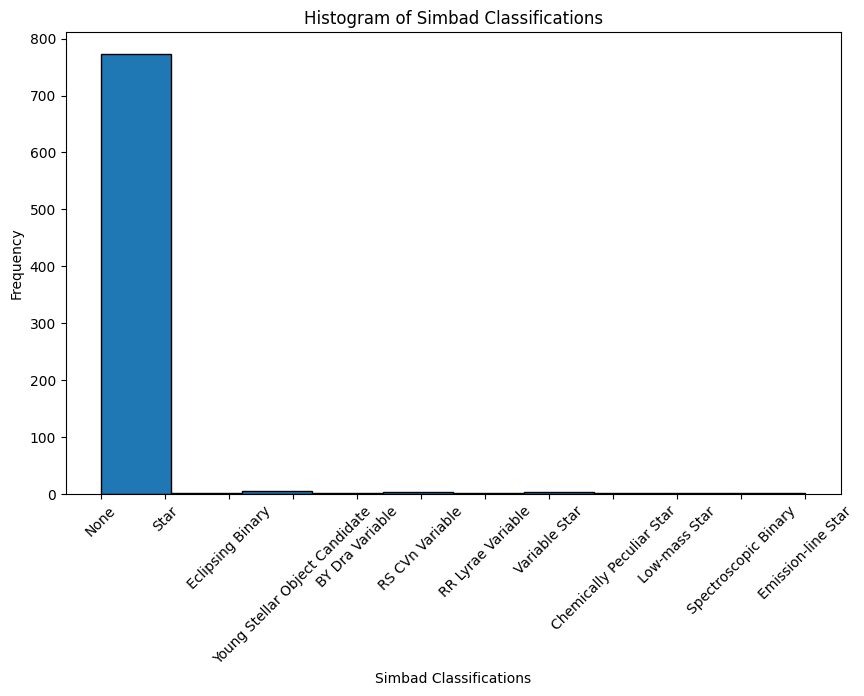

In [249]:
# histogram simbad_classifications results

plt.figure(figsize=(10, 6))
plt.hist(simbad, edgecolor='black')
plt.title('Histogram of Simbad Classifications')
plt.xlabel('Simbad Classifications')
plt.ylabel('Frequency')

# Rotate x-axis labels diagonally
plt.xticks(rotation=45)

# Remove the background grid
plt.grid(False)

plt.show()

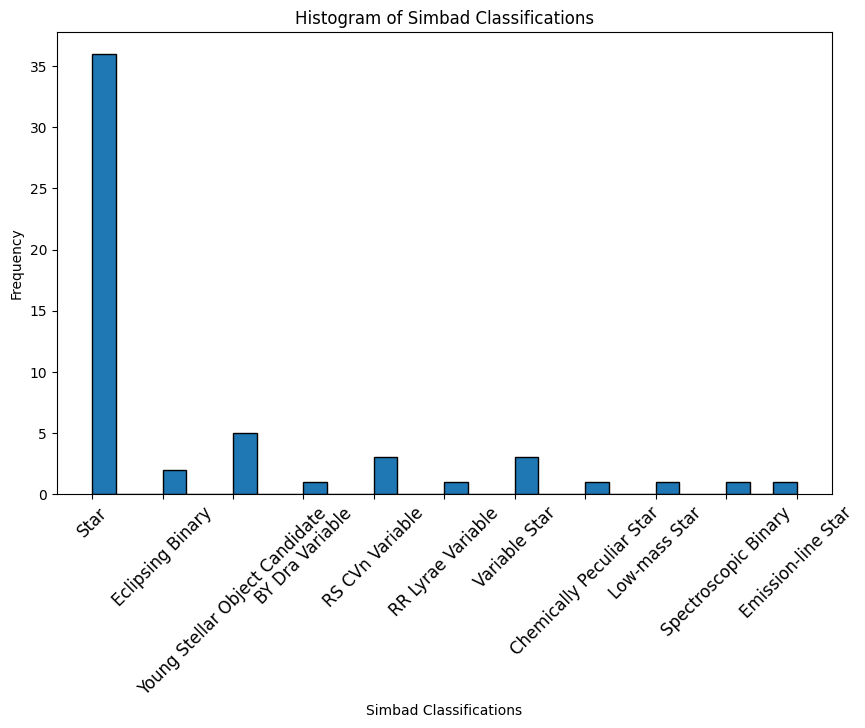

In [254]:
# Filter out 'None' values
filtered_simbad = [x[0] for x in simbad_classifications if len(x) > 0]

plt.figure(figsize=(10, 6))
plt.hist(filtered_simbad, bins=30, edgecolor='black')
plt.title('Histogram of Simbad Classifications')
plt.xlabel('Simbad Classifications')
plt.ylabel('Frequency')

# Rotate x-axis labels diagonally
plt.xticks(rotation=45, fontsize = 12)

# Remove the background grid
plt.grid(False)

plt.show()